In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import os
import warnings
import pandas_profiling
from sklearn import metrics
warnings.filterwarnings('ignore')

In [38]:
data = pd.read_csv('garments_worker_productivity.csv')
profile = pandas_profiling.ProfileReport(data,dark_mode = True)
profile

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

quarter : A portion of the month. A month was divided into four quarters 

team : Associated team number with the instance

no_of_workers : Number of workers in each team

no_of_style_change : Number of changes in the style of a particular product

targeted_productivity : Targeted productivity set by the Authority for each team for each day.

smv : Standard Minute Value, it is the allocated time for a task

wip : Work in progress. Includes the number of unfinished items for products

overtime : Represents the amount of overtime by each team in minutes

incentive : Represents the amount of financial incentive (in BDT) that enables or motivates a particular course of action.

idle_time : The amount of time when the production was interrupted due to several reasons

idle_men : The number of workers who were idle due to production interruption

actual_productivity : The actual % of productivity that was delivered by the workers. It ranges from 0-1.

In [3]:

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE

In [4]:
data

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
0,1/1/2015,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725
1,1/1/2015,Quarter1,finishing,Thursday,1,0.75,3.94,NaN,960,0,0.0,0,0,8.0,0.886500
2,1/1/2015,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
3,1/1/2015,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
4,1/1/2015,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1192,3/11/2015,Quarter2,finishing,Wednesday,10,0.75,2.90,NaN,960,0,0.0,0,0,8.0,0.628333
1193,3/11/2015,Quarter2,finishing,Wednesday,8,0.70,3.90,NaN,960,0,0.0,0,0,8.0,0.625625
1194,3/11/2015,Quarter2,finishing,Wednesday,7,0.65,3.90,NaN,960,0,0.0,0,0,8.0,0.625625
1195,3/11/2015,Quarter2,finishing,Wednesday,9,0.75,2.90,NaN,1800,0,0.0,0,0,15.0,0.505889


In [6]:
data.isnull().sum()

date                       0
quarter                    0
department                 0
day                        0
team                       0
targeted_productivity      0
smv                        0
wip                      506
over_time                  0
incentive                  0
idle_time                  0
idle_men                   0
no_of_style_change         0
no_of_workers              0
actual_productivity        0
dtype: int64

In [7]:
data['wip']=data['wip'].fillna(0)

In [8]:
data.isnull().sum()


date                     0
quarter                  0
department               0
day                      0
team                     0
targeted_productivity    0
smv                      0
wip                      0
over_time                0
incentive                0
idle_time                0
idle_men                 0
no_of_style_change       0
no_of_workers            0
actual_productivity      0
dtype: int64

In [9]:
from sklearn.preprocessing import LabelEncoder

In [10]:
label_encoder=LabelEncoder()

In [11]:
data.loc[:,'department'] = data.loc[:,'department'].str.strip()
data['department'].value_counts()


sweing       691
finishing    506
Name: department, dtype: int64

In [12]:
data

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
0,1/1/2015,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725
1,1/1/2015,Quarter1,finishing,Thursday,1,0.75,3.94,0.0,960,0,0.0,0,0,8.0,0.886500
2,1/1/2015,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
3,1/1/2015,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
4,1/1/2015,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1192,3/11/2015,Quarter2,finishing,Wednesday,10,0.75,2.90,0.0,960,0,0.0,0,0,8.0,0.628333
1193,3/11/2015,Quarter2,finishing,Wednesday,8,0.70,3.90,0.0,960,0,0.0,0,0,8.0,0.625625
1194,3/11/2015,Quarter2,finishing,Wednesday,7,0.65,3.90,0.0,960,0,0.0,0,0,8.0,0.625625
1195,3/11/2015,Quarter2,finishing,Wednesday,9,0.75,2.90,0.0,1800,0,0.0,0,0,15.0,0.505889


In [13]:
data['department_Clean']=label_encoder.fit_transform(data['department'])
data['day_clean']=label_encoder.fit_transform(data['day'])
data['quarter_clean']=label_encoder.fit_transform(data['quarter'])
data.drop('department',inplace=True,axis=1)
data.drop('day',inplace=True,axis=1)
data.drop('date',inplace=True,axis=1)
data.drop('quarter',inplace=True,axis=1)

In [14]:
data

,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,department_Clean,day_clean,quarter_clean
0,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725,1,3,0
1,1,0.75,3.94,0.0,960,0,0.0,0,0,8.0,0.886500,0,3,0
2,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,3,0
3,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,3,0
4,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382,1,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1192,10,0.75,2.90,0.0,960,0,0.0,0,0,8.0,0.628333,0,5,1
1193,8,0.70,3.90,0.0,960,0,0.0,0,0,8.0,0.625625,0,5,1
1194,7,0.65,3.90,0.0,960,0,0.0,0,0,8.0,0.625625,0,5,1
1195,9,0.75,2.90,0.0,1800,0,0.0,0,0,15.0,0.505889,0,5,1


In [15]:
target_productivity=data['targeted_productivity']
target_productivity.value_counts()

0.80    540
0.70    242
0.75    216
0.65     63
0.60     57
0.50     49
0.35     27
0.40      2
0.07      1
Name: targeted_productivity, dtype: int64

In [16]:
data.drop('targeted_productivity',inplace=True,axis=1)

In [17]:
data

,team,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,department_Clean,day_clean,quarter_clean
0,8,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725,1,3,0
1,1,3.94,0.0,960,0,0.0,0,0,8.0,0.886500,0,3,0
2,11,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,3,0
3,12,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,3,0
4,6,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382,1,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1192,10,2.90,0.0,960,0,0.0,0,0,8.0,0.628333,0,5,1
1193,8,3.90,0.0,960,0,0.0,0,0,8.0,0.625625,0,5,1
1194,7,3.90,0.0,960,0,0.0,0,0,8.0,0.625625,0,5,1
1195,9,2.90,0.0,1800,0,0.0,0,0,15.0,0.505889,0,5,1


In [18]:
y=data['actual_productivity']

In [20]:
y.value_counts()

0.800402    24
0.971867    12
0.850137    12
1.000230    11
0.750651    11
            ..
0.850521     1
0.980909     1
0.800261     1
0.626578     1
0.994375     1
Name: actual_productivity, Length: 879, dtype: int64

In [21]:
data.drop('actual_productivity',inplace=True,axis=1)

In [22]:
X=data

In [23]:
X,y

(      team    smv     wip  over_time  incentive  idle_time  idle_men  \
 0        8  26.16  1108.0       7080         98        0.0         0   
 1        1   3.94     0.0        960          0        0.0         0   
 2       11  11.41   968.0       3660         50        0.0         0   
 3       12  11.41   968.0       3660         50        0.0         0   
 4        6  25.90  1170.0       1920         50        0.0         0   
 ...    ...    ...     ...        ...        ...        ...       ...   
 1192    10   2.90     0.0        960          0        0.0         0   
 1193     8   3.90     0.0        960          0        0.0         0   
 1194     7   3.90     0.0        960          0        0.0         0   
 1195     9   2.90     0.0       1800          0        0.0         0   
 1196     6   2.90     0.0        720          0        0.0         0   
 
       no_of_style_change  no_of_workers  department_Clean  day_clean  \
 0                      0           59.0         

In [48]:
from sklearn.preprocessing import MinMaxScaler

In [49]:
X_normalised= MinMaxScaler().fit_transform(X)


In [50]:
X_normalised

array([[0.63636364, 0.45025165, 0.04791973, ..., 1.        , 0.6       ,
        0.        ],
       [0.        , 0.02013163, 0.        , ..., 0.        , 0.6       ,
        0.        ],
       [0.90909091, 0.16473093, 0.04186489, ..., 1.        , 0.6       ,
        0.        ],
       ...,
       [0.54545455, 0.01935734, 0.        , ..., 0.        , 1.        ,
        0.25      ],
       [0.72727273, 0.        , 0.        , ..., 0.        , 1.        ,
        0.25      ],
       [0.45454545, 0.        , 0.        , ..., 0.        , 1.        ,
        0.25      ]])

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X_normalised, y, test_size=0.25, random_state=42)

In [53]:
X_train, X_test, y_train, y_test 

(array([[0.81818182, 0.36624081, 0.07239858, ..., 1.        , 1.        ,
         0.25      ],
        [0.45454545, 0.1686024 , 0.04342185, ..., 1.        , 0.8       ,
         0.25      ],
        [1.        , 0.02284166, 0.        , ..., 0.        , 0.8       ,
         0.25      ],
        ...,
        [0.36363636, 0.02013163, 0.        , ..., 0.        , 0.        ,
         0.25      ],
        [0.54545455, 0.52651955, 0.01920249, ..., 1.        , 0.6       ,
         0.5       ],
        [0.81818182, 0.        , 0.        , ..., 0.        , 0.4       ,
         0.25      ]]),
 array([[0.        , 0.37998451, 0.03062019, ..., 1.        , 0.8       ,
         0.75      ],
        [0.45454545, 0.16473093, 0.04445982, ..., 1.        , 0.        ,
         0.5       ],
        [0.63636364, 0.        , 0.        , ..., 0.        , 0.8       ,
         0.        ],
        ...,
        [0.72727273, 0.30758808, 0.09095234, ..., 1.        , 0.        ,
         0.5       ],
        [1. 

In [54]:
model=RandomForestRegressor(n_estimators=100,criterion="mae",random_state=42,n_jobs=-1)

In [55]:
model.fit(X_train,y_train)

RandomForestRegressor(criterion='mae', n_jobs=-1, random_state=42)

In [56]:
y_predicted=model.predict(X_test)


In [57]:
from scipy.stats import norm


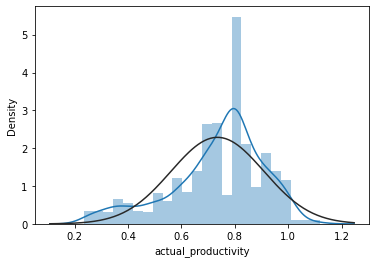

<Figure size 432x288 with 0 Axes>

In [59]:
data_new = pd.read_csv('garments_worker_productivity.csv')
sns.distplot(data_new['actual_productivity'],fit=norm);
fig = plt.figure()


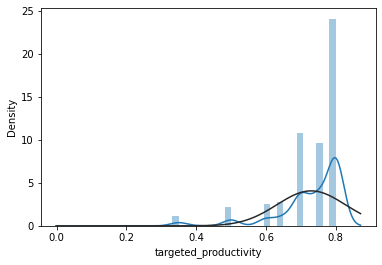

<Figure size 432x288 with 0 Axes>

In [60]:
sns.distplot(data_new['targeted_productivity'],fit=norm);
fig = plt.figure()


In [64]:
from sklearn.metrics import r2_score
from sklearn import metrics

In [62]:
r2_score(y_test,y_predicted)

0.3813651373635891

In [65]:
metrics.mean_absolute_error(y_test,y_predicted)

0.08569499503034995

In [66]:
model_1=RandomForestRegressor(n_estimators=100,criterion="mse",random_state=42,n_jobs=-1)

In [67]:
model_1.fit(X_train,y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [68]:
y_predicted_1=model.predict(X_test)

In [69]:
r2_score(y_test,y_predicted_1)

0.3813651373635891

In [70]:
from sklearn import metrics

In [71]:
metrics.mean_absolute_error(y_test,y_predicted_1)

0.08569499503034995

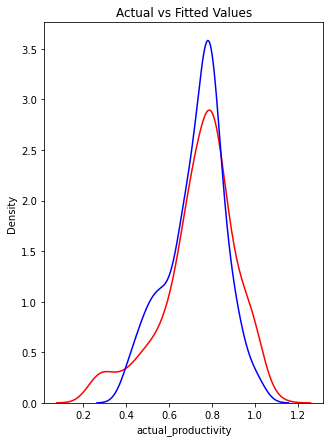

In [72]:
#Have to work on pipeline with std scaler
import seaborn as sns

plt.figure(figsize=(5, 7))

ax = sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_predicted, hist=False, color="b", label="Fitted Values" , ax=ax)

plt.title('Actual vs Fitted Values')


plt.show()

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [74]:
X_train_norm= MinMaxScaler().fit_transform(X_train)

In [75]:
X_test_norm= MinMaxScaler().fit_transform(X_test)

In [76]:
model_3=RandomForestRegressor(n_estimators=100,criterion="mse",random_state=42,n_jobs=-1)

In [77]:
model_3.fit(X_train_norm,y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [78]:
y_predicted_3=model_3.predict(X_test)

In [79]:
metrics.mean_absolute_error(y_test,y_predicted_3)

0.22353165428729924

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_Pipeline

In [85]:
from sklearn.metrics import mean_squared_error
rmse = np.sqrt(mean_squared_error(y_test,y_predicted_3))
print ("RMS Error: ", rmse)

r_squared = model_3.score(X_train_norm, y_train)
print ("R_squared is: ", r_squared)

RMS Error:  0.251968114227003
R_squared is:  0.9247099082360813


In [94]:
data_new.dtypes

date                      object
quarter                   object
department                object
day                       object
team                       int64
targeted_productivity    float64
smv                      float64
wip                      float64
over_time                  int64
incentive                  int64
idle_time                float64
idle_men                   int64
no_of_style_change         int64
no_of_workers            float64
actual_productivity      float64
dtype: object

0       0.940725
1       0.886500
2       0.800570
3       0.800570
4       0.800382
          ...   
1192    0.628333
1193    0.625625
1194    0.625625
1195    0.505889
1196    0.394722
Name: actual_productivity, Length: 1197, dtype: float64

In [97]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [98]:
model_4=RandomForestRegressor(n_estimators=100,criterion="mse",random_state=42,n_jobs=-1)
model_4.fit(X_train,y_train)
y_predicted_4=model_4.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test,y_predicted_4))
print ("RMS Error: ", rmse)

r_squared = model_3.score(X_train, y_train)
print ("R_squared is: ", r_squared)

RMS Error:  0.13469535312450842
R_squared is:  -1.2493930033207268


ValueError: x and y must be the same size

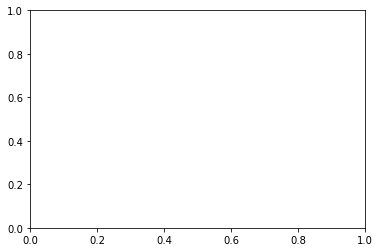

In [101]:
plt.scatter(X,y,color = 'red')
plt.plot(X_test, y_predicted_4, color = 'blue')
plt.xlabel('Features')
plt.ylabel('Productivity')
plt.show()

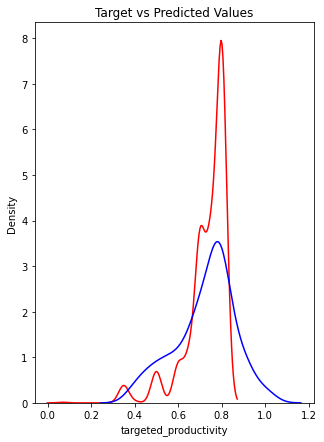

In [102]:
plt.figure(figsize=(5, 7))

ax = sns.distplot(target_productivity, hist=False, color="r", label="Target Value")
sns.distplot(y_predicted_4, hist=False, color="b", label="Predicted Values" , ax=ax)

plt.title('Target vs Predicted Values')


plt.show()

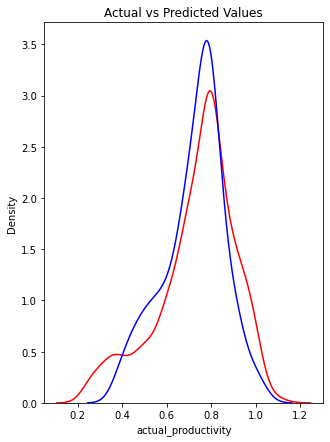

In [103]:
plt.figure(figsize=(5, 7))

ax = sns.distplot(y, hist=False, color="r", label="Target Value")
sns.distplot(y_predicted_4, hist=False, color="b", label="Predicted Values" , ax=ax)

plt.title('Actual vs Predicted Values')


plt.show()

In [ ]:
import matplotlib.pyplot as plt

#gridnumber = range(1,4)

b1 = plt.bar(, [0.2, 0.3, 0.1], width=0.4,
                label="Bar 1", align="center")

b2 = plt.bar(gridnumber, [0.3, 0.2, 0.2], color="red", width=0.4,
                label="Bar 2", align="center")


plt.ylim([0,0.5])
plt.xlim([0,4])
plt.xticks(gridnumber)
plt.legend()
plt.show()

In [ ]:
import pandas as pd
model = ['crierion=mae', 'criterion=mse', 'model3', 'model4']
RMS Error = [0.01, 0.05, 0.10, 0.25]
df = pd.DataFrame(worth, columns=['1x'], index=coins)
df['2x'] = df['1x'] * 2 
df['3x'] = df['1x'] * 3 
df['4x'] = df['1x'] * 4 
df['5x'] = df['1x'] * 5 

In [26]:
y

0       0.940725
1       0.886500
2       0.800570
3       0.800570
4       0.800382
          ...   
1192    0.628333
1193    0.625625
1194    0.625625
1195    0.505889
1196    0.394722
Name: actual_productivity, Length: 1197, dtype: float64

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

In [31]:
pipe=make_pipeline(StandardScaler(),RandomForestRegressor(n_estimators=100,criterion="mse",random_state=42,n_jobs=-1))
pipe.fit(X_train,y_train)
y_predicted_5=pipe.predict(X_test)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestregressor',
                 RandomForestRegressor(n_jobs=-1, random_state=42))])

In [45]:
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

mae=metrics.mean_absolute_error(y_test,y_predicted_5)
print ("MAE Error: ", mae)

rmse = np.sqrt(mean_squared_error(y_test,y_predicted_5))
print ("RMS Error: ", rmse)

r_squared = pipe.score(X_test, y_test)
print ("R_squared is: ", r_squared)

MAE Error:  0.08702187507433469
RMS Error:  0.13453284443770216
R_squared is:  0.3606865721214658


In [37]:
r_squared = pipe.score(X_train, y_train)
print ("R_squared is: ", r_squared)

R_squared is:  0.9246121547123904


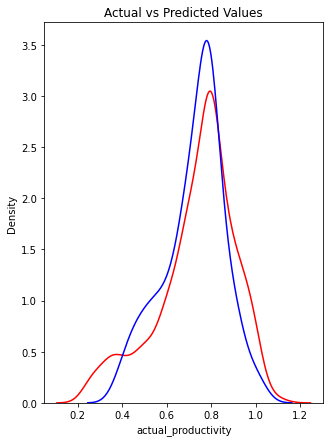

In [39]:
plt.figure(figsize=(5, 7))

ax = sns.distplot(y, hist=False, color="r", label="Actual Value")
sns.distplot(y_predicted_5, hist=False, color="b", label="Predicted Values" , ax=ax)

plt.title('Actual vs Predicted Values')


plt.show()

In [41]:
from sklearn.preprocessing import MinMaxScaler
pipe=make_pipeline(MinMaxScaler(),RandomForestRegressor(n_estimators=100,criterion="mse",random_state=42,n_jobs=-1))
pipe.fit(X_train,y_train)
y_predicted_6=pipe.predict(X_test)

In [44]:
mae=metrics.mean_absolute_error(y_test,y_predicted_6)
print ("MAE Error: ", mae)

rmse = np.sqrt(mean_squared_error(y_test,y_predicted_6))
print ("RMS Error: ", rmse)

r_squared = pipe.score(X_test, y_test)
print ("R_squared is: ", r_squared)

MAE Error:  0.08661698769924359
RMS Error:  0.13417338036090415
R_squared is:  0.3606865721214658
